# Concord analysis of kidney

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import Concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [8]:
proj_name = "kidney_GSE149134"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/McMahon_kidney/GSE149134/"
data_dir = Path(data_dir)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

cuda:3


'Dec05-0854'

In [ ]:
import os
import pandas as pd
import scipy.io
import scipy.sparse as sp
import scanpy as sc

# Initialize a list to store AnnData objects
adata_list = []

# Iterate over each dataset
for filename in os.listdir(data_dir):
    if filename.endswith("matrix.mtx.gz"):
        # Extract the base name without file extensions
        base_name = filename.split("_matrix.mtx.gz")[0]

        # Parse metadata from the base name
        sample = base_name.split("_")[0]  # e.g., 'GSM4648412'
        sample_type = base_name.split("_")[1]  # e.g., 'MEK' or 'EK'
        stage = base_name.split("_")[2]  # e.g., 'E15', 'E17', 'P0', 'transplant'

        # Paths to the required files
        barcodes_path = os.path.join(data_dir, f"{base_name}_barcodes.tsv.gz")
        features_path = os.path.join(data_dir, f"{base_name}_features.tsv.gz")
        matrix_path = os.path.join(data_dir, filename)

        # Read the matrix, barcodes, and features
        matrix = scipy.io.mmread(matrix_path).T  # Transpose to have cells as rows, genes as columns
        barcodes = pd.read_csv(barcodes_path, header=None)[0].values
        features = pd.read_csv(features_path, header=None)[0].values  

        # Split features into gene_id and gene_name
        features_split = [feature.split("\t")[:2] for feature in features]
        gene_ids, gene_names = zip(*features_split)

        # Create AnnData object
        adata = sc.AnnData(X=sp.csr_matrix(matrix))  # Convert to sparse CSR format
        adata.obs_names = barcodes
        adata.var = pd.DataFrame({"gene_id": gene_ids, "gene_name": gene_names})
        adata.var_names = adata.var["gene_name"]  # Use gene_name as var_names

        # Add metadata to adata.obs
        adata.obs["sample"] = sample
        adata.obs["sample_type"] = sample_type
        adata.obs["stage"] = stage

        # Ensure unique obs_names
        adata.obs_names = [f"{barcode}-{sample}" for barcode in adata.obs_names]

        # Append to the list
        adata_list.append(adata)

# Combine all AnnData objects
adata_combined = sc.concat(adata_list, axis=0)
adata_combined.obs['dataset'] = 'GSE149134'
adata_combined.obs['species'] = 'mouse'
# Save the combined AnnData object
adata_combined.write(os.path.join(data_dir, "GSE149134_combined_data.h5ad"))

# Check the result
print(adata_combined)


AnnData object with n_obs × n_vars = 28189 × 20672
    obs: 'sample', 'sample_type', 'stage', 'dataset'


In [ ]:
adata = sc.read(data_dir / "GSE149134_combined_data.h5ad")

### No batch correction, PCA and UMAP

In [21]:
# Check if any duplicate in adata.var_names
print(adata.var_names.duplicated().sum())

0


In [20]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
ccd.ul.score_cell_cycle(adata, organism='Mm')

ParseError: mismatched tag: line 62, column 2 (<string>)

In [22]:
n_pcs = 50
sc.pp.pca(adata, n_comps=n_pcs)
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=n_pcs)
sc.tl.umap(adata, min_dist=0.1)

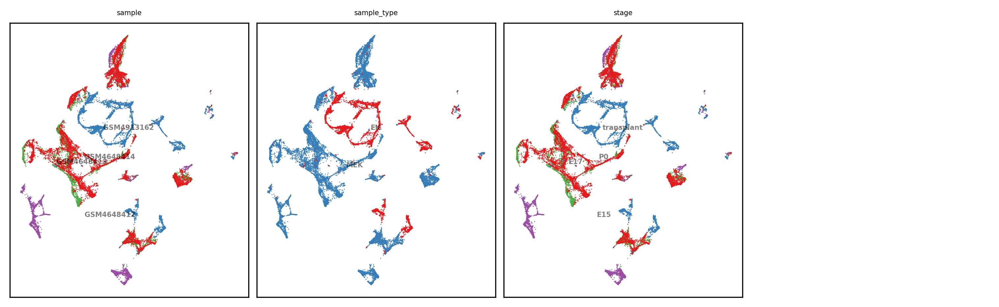

In [23]:
show_basis = 'X_umap'
show_cols = ['sample', 'sample_type', 'stage']

ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(10,3), dpi=300, ncols=4, font_size=5, point_size=2, legend_loc='on data',
    save_path=save_dir / f"wtbatch_{show_basis}_{file_suffix}.png"
)

### Concord

In [24]:
output_key = f'Concord_{file_suffix}'
feature_list = ccd.ul.select_features(adata, n_top_features=10000, flavor='seurat_v3')
cur_ccd = ccd.Concord(adata=adata, input_feature=feature_list, 
                      domain_key='sample', 
                      latent_dim=32,
                      n_epochs=10,
                      augmentation_mask_prob = 0.3, 
                      clr_temperature = .5, # Check out advanced usage to learn what this parameter controls, 
                      use_decoder=True,
                      seed=seed, 
                      inplace=False, 
                      verbose=False, 
                      device=device,
                      save_dir=save_dir) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
cur_ccd.encode_adata(input_layer_key='X_log1p', output_key=output_key)

# Save the latent embedding to a filem, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")
adata.obsm = cur_ccd.adata.obsm # If not inplace

Concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
p_intra_knn: 0.3


Epoch 0 Training: 437it [00:07, 56.84it/s, loss=3.56]
Epoch 9 Training: 100%|██████████| 437/437 [00:06<00:00, 66.13it/s, loss=3.48]


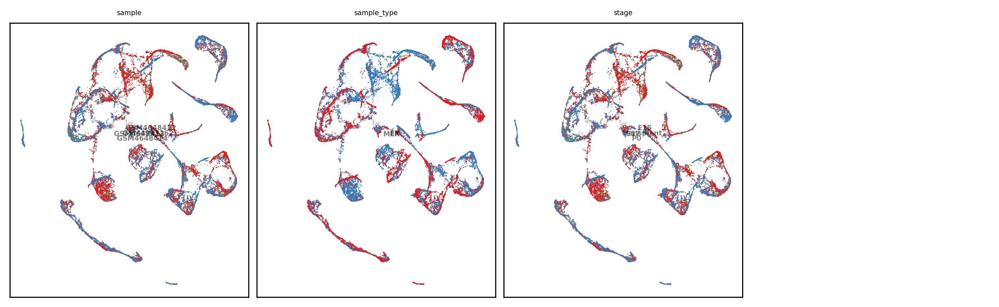

In [25]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
show_cols = ['sample', 'sample_type', 'stage']
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(10,3), dpi=300, ncols=4, font_size=5, point_size=2, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [26]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
for col in show_cols:
    show_basis = f'{output_key}_UMAP_3D'
    ccd.pl.plot_embedding_3d(
            adata, basis=show_basis, color_by=col,
            save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.html',
            point_size=1, opacity=0.8, width=1500, height=1000
        )

In [27]:

adata.write_h5ad(data_dir / f"adata_processed_{file_suffix}.h5ad")

file_suffix

'Dec05-0854'